<a href="https://colab.research.google.com/github/Khyatikhurana/EDA/blob/main/EDA_THEORYDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

DATA CLEANING

In [6]:
print("Khyati Khurana - 21BDS0349")
# Step 1: Load the dataset
import pandas as pd

file_path = '/content/sample_data/superbowl_commercials.csv'
data = pd.read_csv(file_path)

# Display the first few rows and check initial data types
print("Initial Data Preview:")
print(data.head())
print("\nData Types:")
print(data.dtypes)


Khyati Khurana - 21BDS0349
Initial Data Preview:
   Year      Brand                                 Superbowl Ads Link  \
0  2000    E-Trade  https://superbowl-ads.com/2000-etrade-monkey-d...   
1  2000    E-Trade  https://superbowl-ads.com/2000-etrade-money-ou...   
2  2000  Budweiser  https://superbowl-ads.com/2000-budweiser-whaas...   
3  2000  Bud Light  https://superbowl-ads.com/2000-bud-light-hold-...   
4  2000  Budweiser  https://superbowl-ads.com/2000-budweiser-talki...   

                                  Youtube Link  Funny  Shows Product Quickly  \
0  https://www.youtube.com/watch?v=Muyq2kMDFoA   True                   True   
1  https://www.youtube.com/watch?v=oftjwYmlfoA   True                   True   
2  https://www.youtube.com/watch?v=loimTUjV92Q   True                   True   
3  https://www.youtube.com/watch?v=M3IV93HwSkc   True                   True   
4  https://www.youtube.com/watch?v=dK1tlG778J8   True                  False   

   Patriotic  Celebrity  Danger

In [3]:
# Step 2: Check for Missing Values
print("\nMissing Values Count:")
print(data.isnull().sum())

# Optionally display percentage of missing values
missing_percentage = data.isnull().sum() / len(data) * 100
print("\nMissing Values Percentage:")
print(missing_percentage)

# Handling missing values (example: drop rows with missing values)
data = data.dropna()  # This drops all rows with any missing values
# Alternatively, fill missing values with a placeholder, mean, or median:
# data.fillna(value={'Column_Name': 'Unknown'}, inplace=True)  # Replace with specific values per column



Missing Values Count:
Year                      0
Brand                     0
Superbowl Ads Link        0
Youtube Link              9
Funny                     0
Shows Product Quickly     0
Patriotic                 0
Celebrity                 0
Danger                    0
Animals                   0
Uses Sex                  0
Length                    0
Estimated Cost            0
Youtube Views            12
Youtube Likes            18
TV Viewers                0
dtype: int64

Missing Values Percentage:
Year                     0.000000
Brand                    0.000000
Superbowl Ads Link       0.000000
Youtube Link             3.614458
Funny                    0.000000
Shows Product Quickly    0.000000
Patriotic                0.000000
Celebrity                0.000000
Danger                   0.000000
Animals                  0.000000
Uses Sex                 0.000000
Length                   0.000000
Estimated Cost           0.000000
Youtube Views            4.819277
Youtube Like

In [4]:
# Step 3: Remove Duplicates
print("\nNumber of Duplicate Rows:", data.duplicated().sum())

# Drop duplicate rows
data = data.drop_duplicates()

# Check data dimensions after removing duplicates
print("\nData Dimensions After Removing Duplicates:", data.shape)



Number of Duplicate Rows: 0

Data Dimensions After Removing Duplicates: (231, 16)


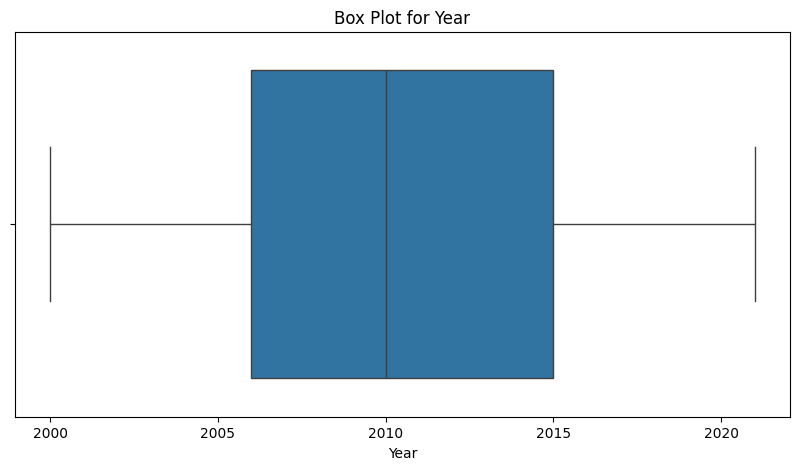

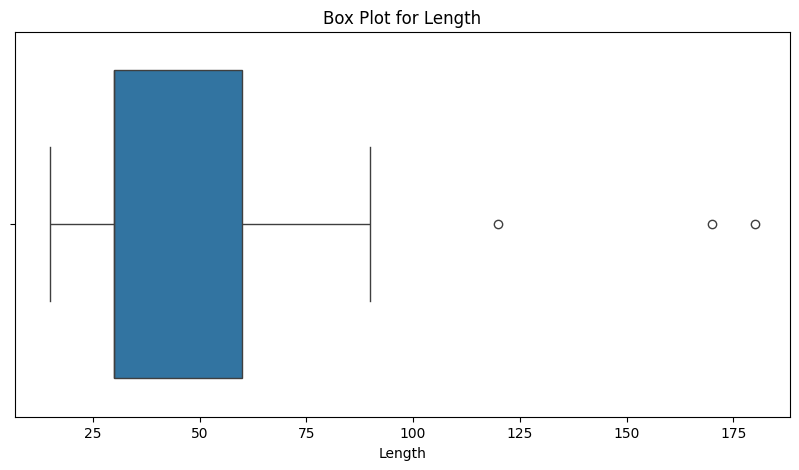

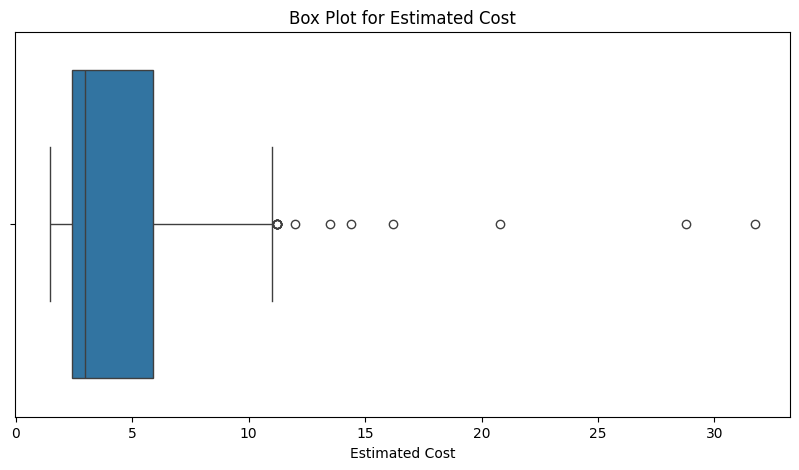

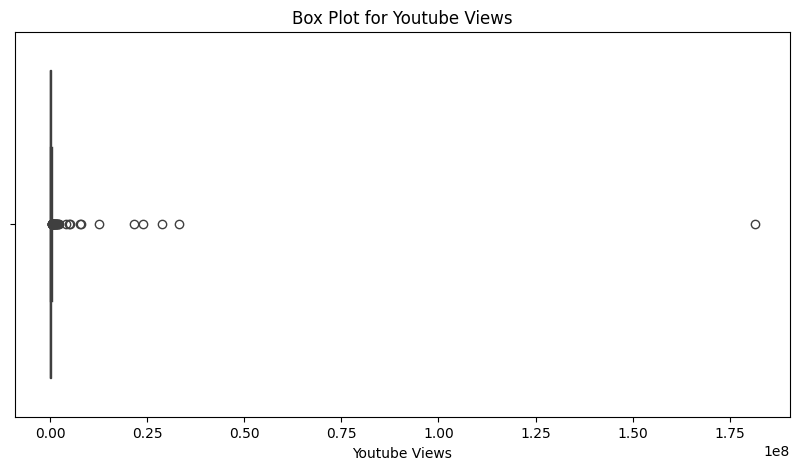

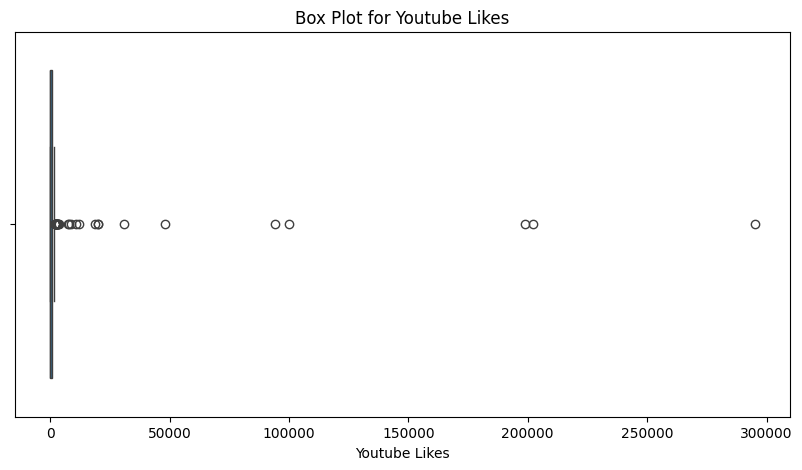

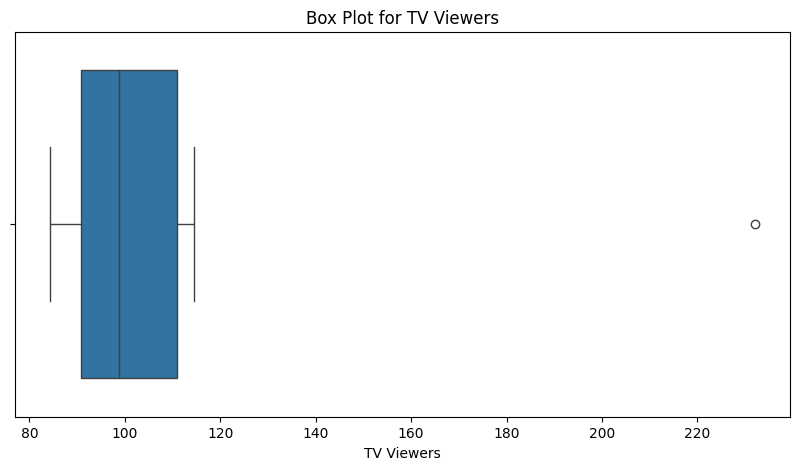


Data Dimensions After Removing Outliers: (166, 16)


In [5]:
# Step 4: Handle Outliers
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize outliers for numerical columns using boxplots
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns

for col in numerical_columns:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=data[col])
    plt.title(f'Box Plot for {col}')
    plt.show()

# Example: Removing outliers using the IQR method for each numerical column
for col in numerical_columns:
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    # Filter out rows with outliers
    data = data[(data[col] >= Q1 - 1.5 * IQR) & (data[col] <= Q3 + 1.5 * IQR)]

print("\nData Dimensions After Removing Outliers:", data.shape)


In [6]:
# Step 5: Encode Categorical Variables
# List categorical columns
categorical_columns = data.select_dtypes(include=['object']).columns
print("Categorical Columns:", categorical_columns)

# Convert categorical columns to dummy variables
data = pd.get_dummies(data, columns=categorical_columns, drop_first=True)

# Check data after encoding
print("\nData After Encoding Categorical Variables:")
print(data.head())


Categorical Columns: Index(['Brand', 'Superbowl Ads Link', 'Youtube Link'], dtype='object')

Data After Encoding Categorical Variables:
   Year  Funny  Shows Product Quickly  Patriotic  Celebrity  Danger  Animals  \
0  2000   True                   True      False      False   False     True   
1  2000   True                   True      False      False    True    False   
2  2000   True                   True      False      False   False    False   
3  2000   True                   True      False      False    True    False   
4  2000   True                  False      False      False   False     True   

   Uses Sex  Length  Estimated Cost  ...  \
0     False      30             2.1  ...   
1     False      30             2.1  ...   
2     False      30             2.1  ...   
3     False      30             2.1  ...   
4     False      30             2.1  ...   

   Youtube Link_https://www.youtube.com/watch?v=wegrVsP3gK4  \
0                                              False   

In [7]:
# Step 6: Normalize Numerical Variables
from sklearn.preprocessing import MinMaxScaler

# Initialize the scaler
scaler = MinMaxScaler()

# Normalize the numerical columns
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])

# Check data after normalization
print("\nData After Normalization:")
print(data.head())



Data After Normalization:
   Year  Funny  Shows Product Quickly  Patriotic  Celebrity  Danger  Animals  \
0   0.0   True                   True      False      False   False     True   
1   0.0   True                   True      False      False    True    False   
2   0.0   True                   True      False      False   False    False   
3   0.0   True                   True      False      False    True    False   
4   0.0   True                  False      False      False   False     True   

   Uses Sex  Length  Estimated Cost  ...  \
0     False     0.2        0.066107  ...   
1     False     0.2        0.066107  ...   
2     False     0.2        0.066107  ...   
3     False     0.2        0.066107  ...   
4     False     0.2        0.066107  ...   

   Youtube Link_https://www.youtube.com/watch?v=wegrVsP3gK4  \
0                                              False          
1                                              False          
2                                     

UNIVARIATE ANALYSIS

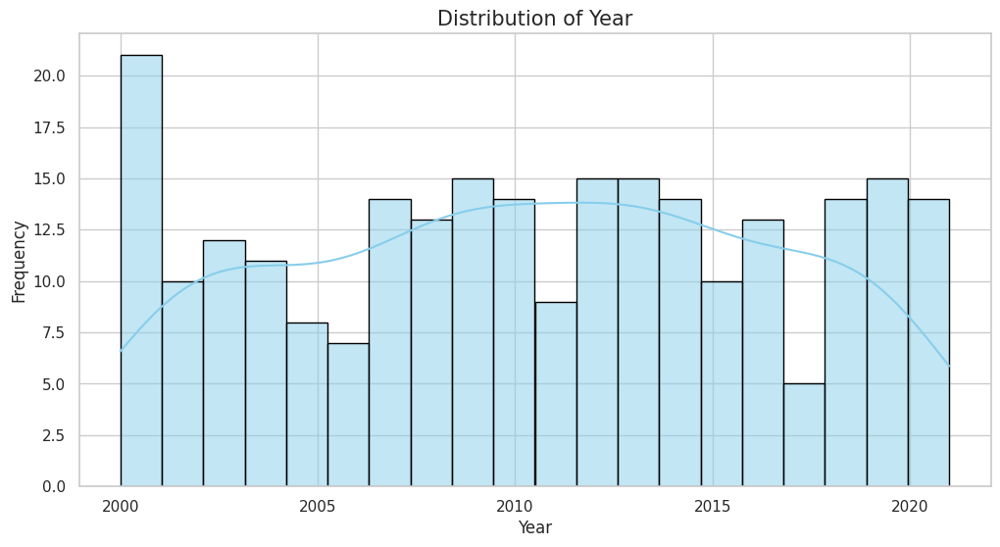

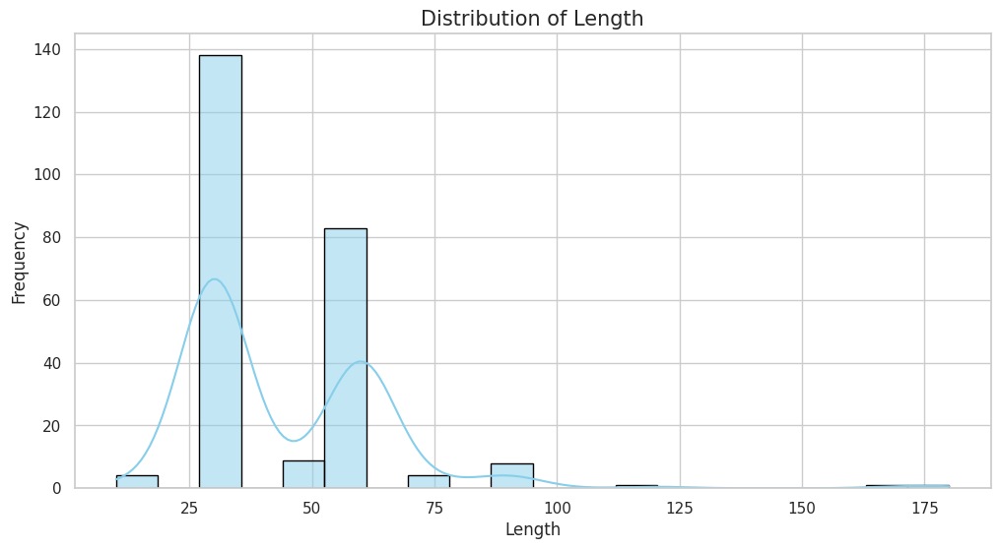

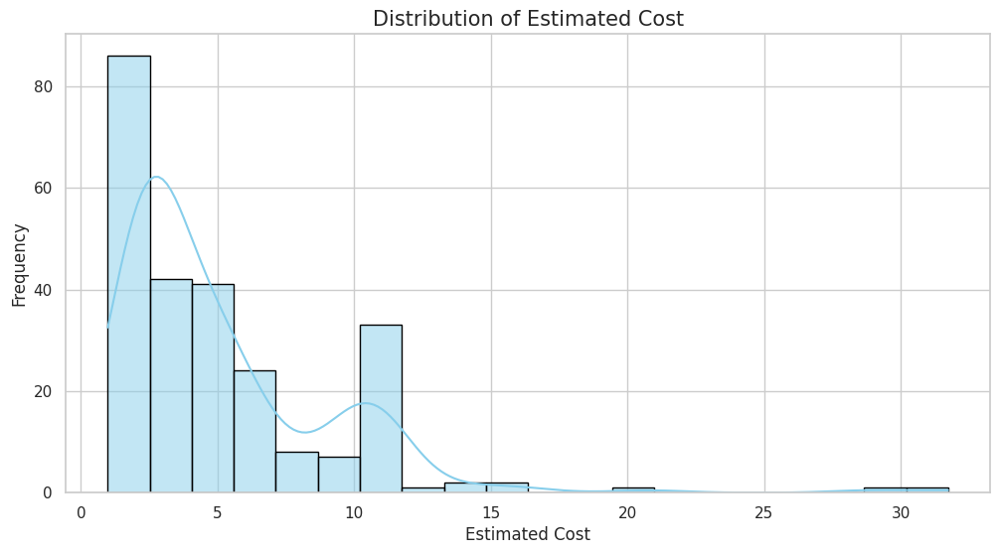

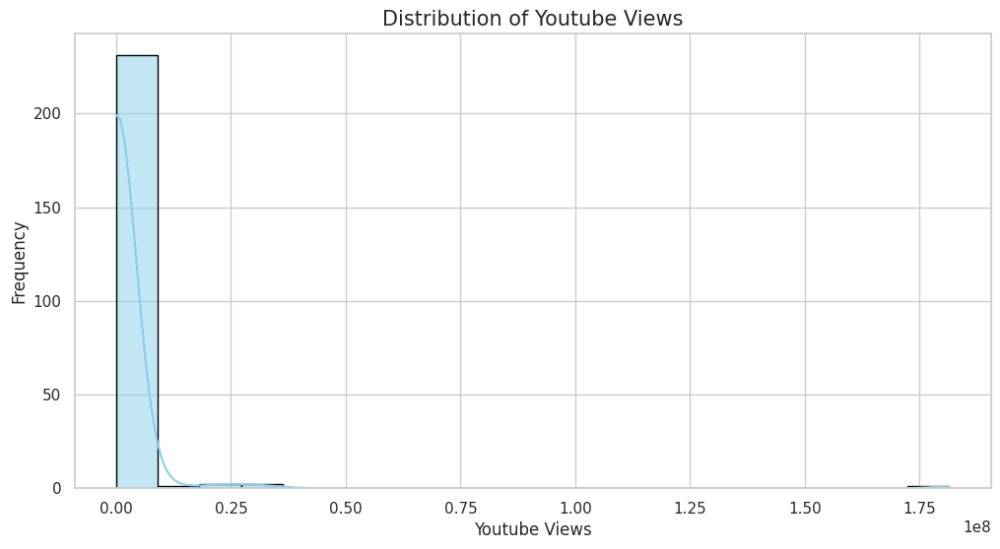

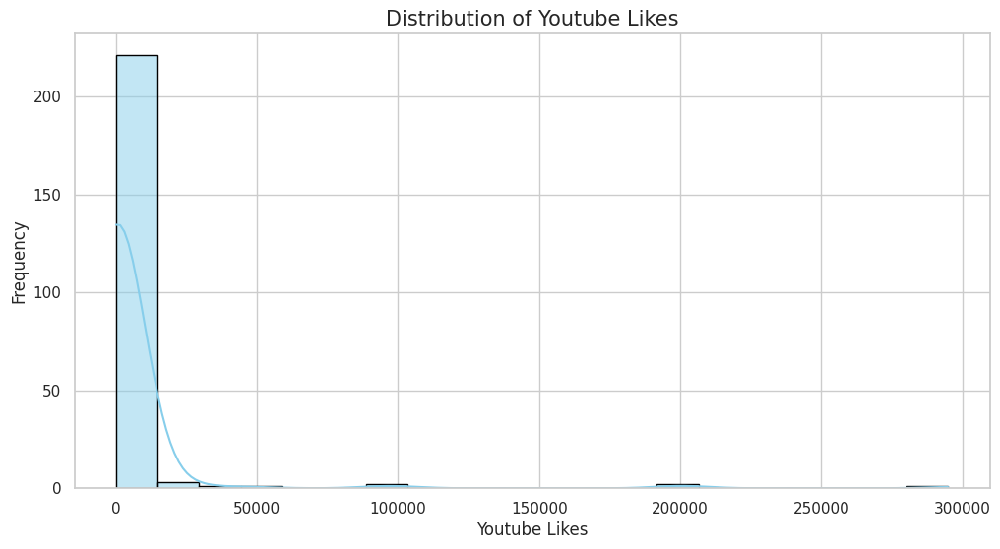

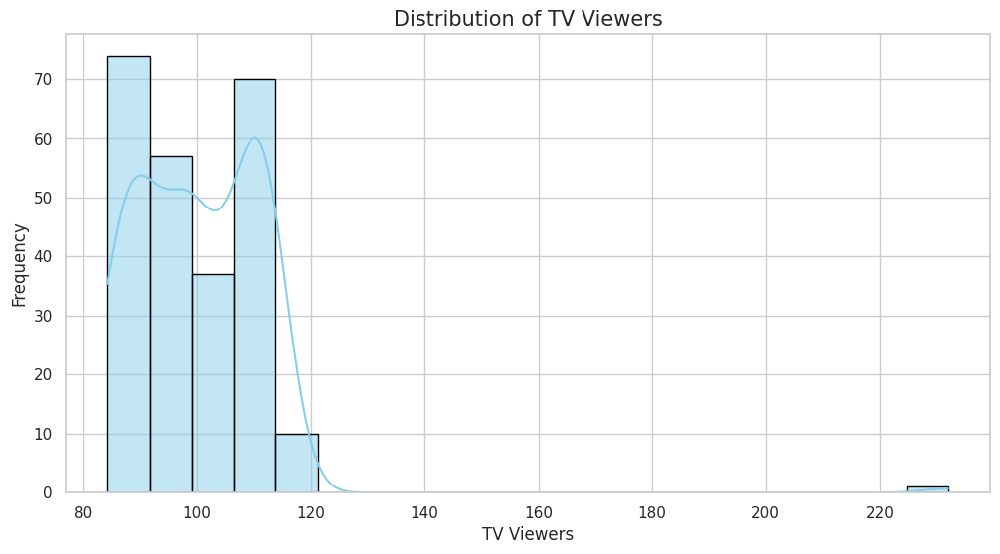

<ipython-input-9-09b37d027e06>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=data[col], palette="viridis", edgecolor="black", order=data[col].value_counts().index)


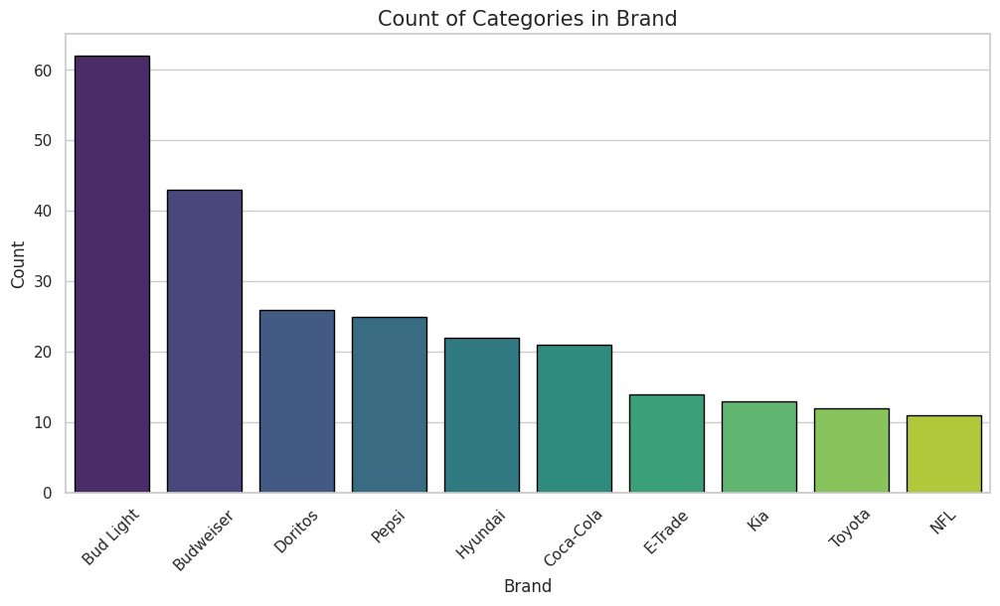

<ipython-input-9-09b37d027e06>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=data[col], palette="viridis", edgecolor="black", order=data[col].value_counts().index)


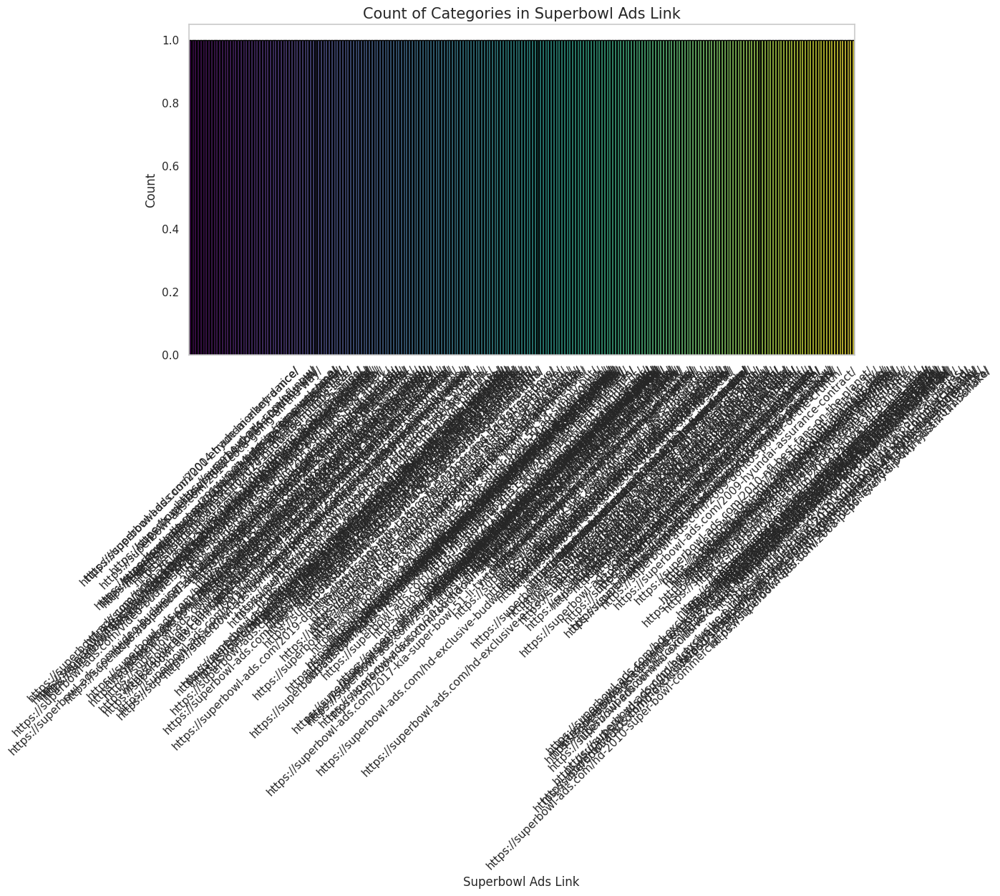

<ipython-input-9-09b37d027e06>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=data[col], palette="viridis", edgecolor="black", order=data[col].value_counts().index)


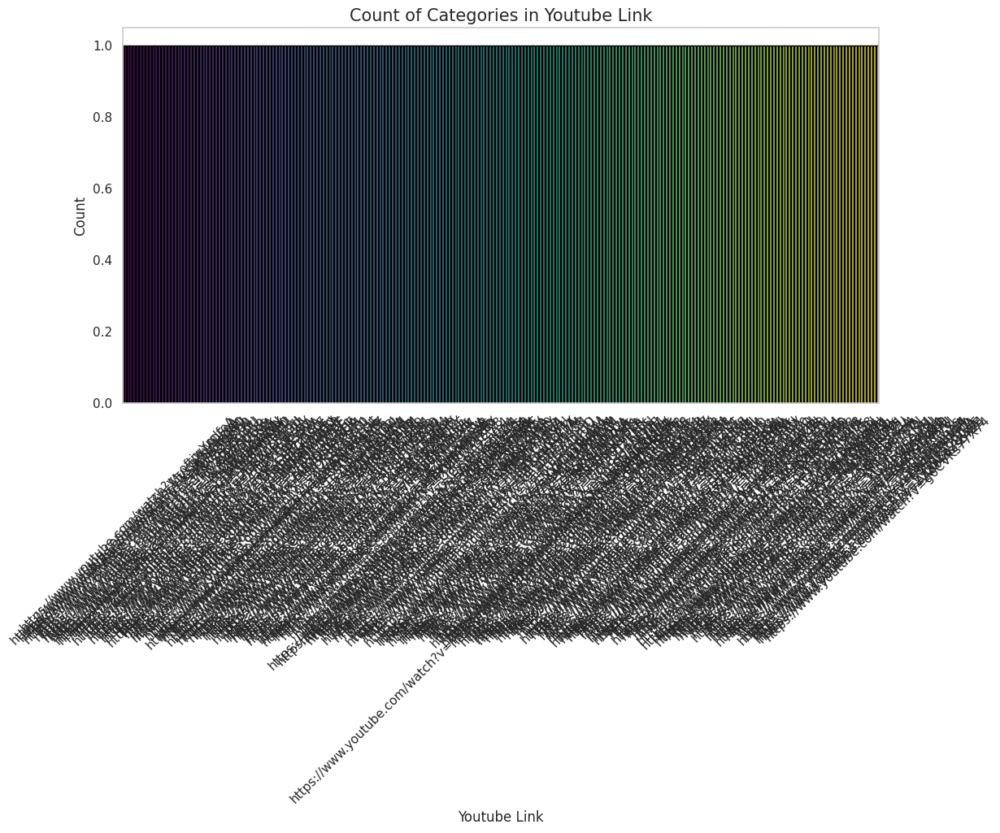

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/sample_data/superbowl_commercials.csv'
data = pd.read_csv(file_path)

# Set a colorful style
sns.set(style="whitegrid", palette="pastel")

# Separate numerical and categorical columns
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns
categorical_columns = data.select_dtypes(include=['object']).columns

# Univariate Analysis for Numerical Variables with Custom Colors
for col in numerical_columns:
    plt.figure(figsize=(12, 6))
    sns.histplot(data[col], kde=True, color="skyblue", edgecolor="black", bins=20)
    plt.title(f'Distribution of {col}', fontsize=15)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.show()

# Univariate Analysis for Categorical Variables with Custom Colors
for col in categorical_columns:
    plt.figure(figsize=(12, 6))
    sns.countplot(x=data[col], palette="viridis", edgecolor="black", order=data[col].value_counts().index)
    plt.title(f'Count of Categories in {col}', fontsize=15)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=45)
    plt.show()


BIVARIATE ANALYSIS


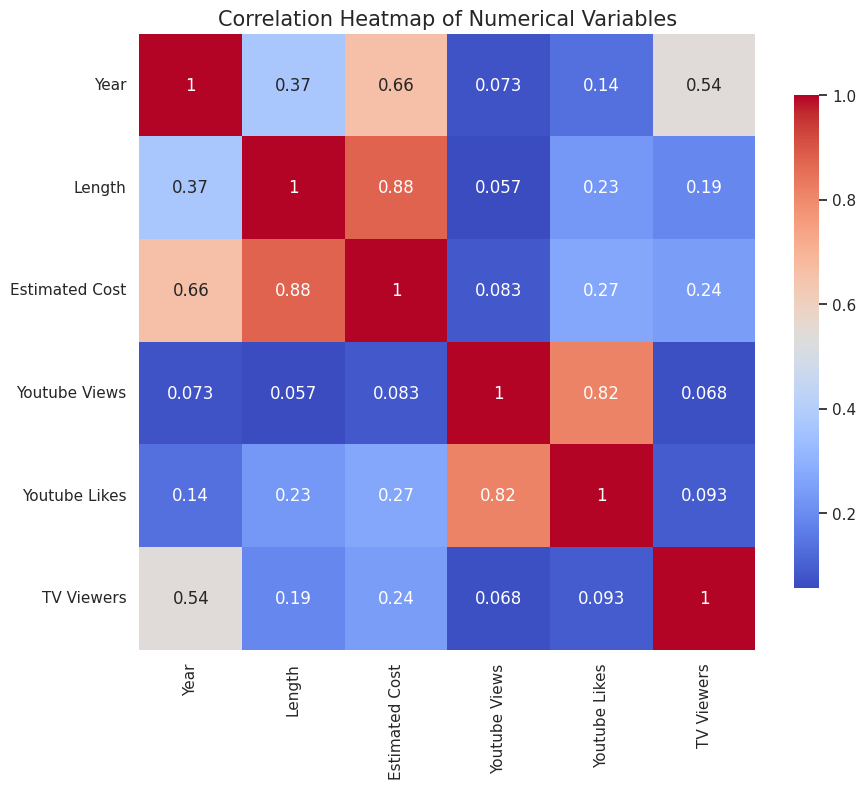

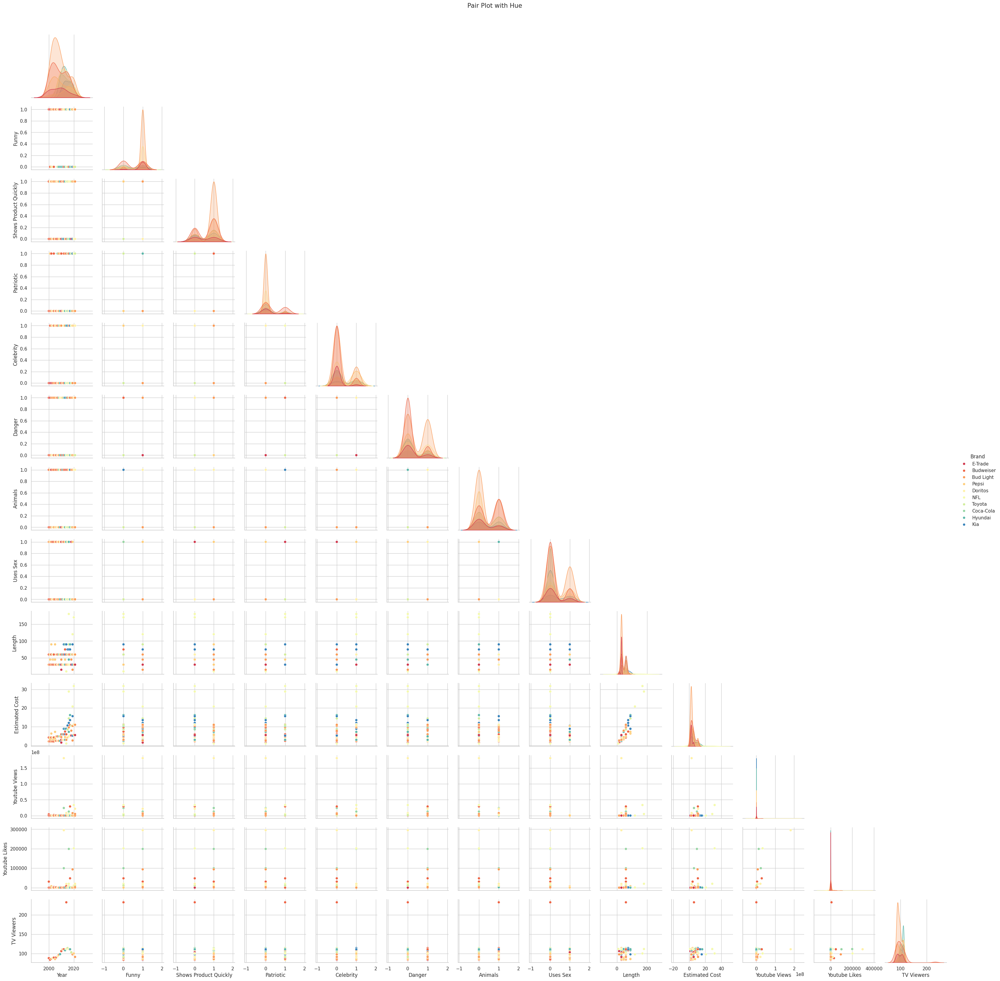

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


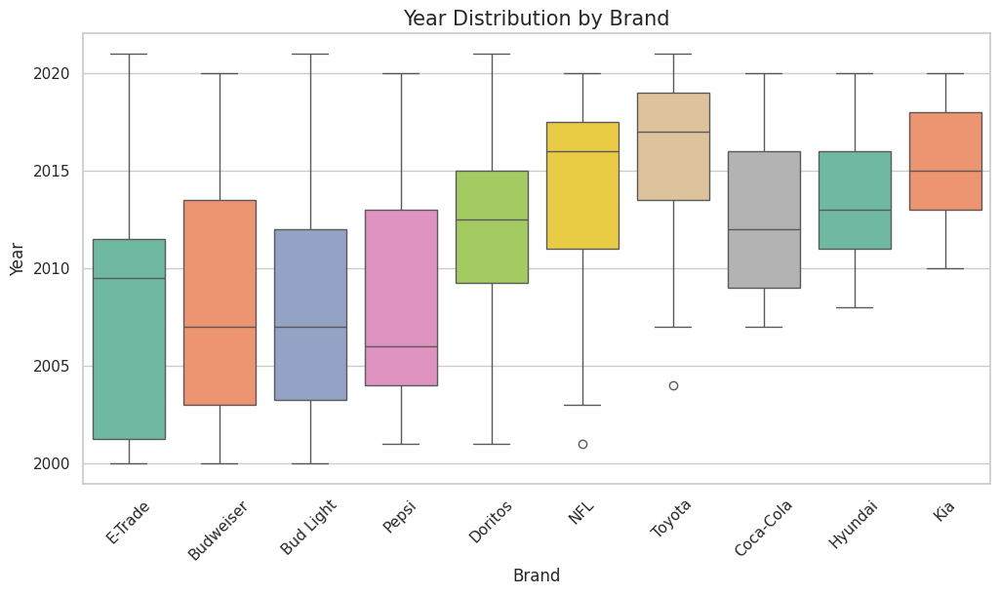

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


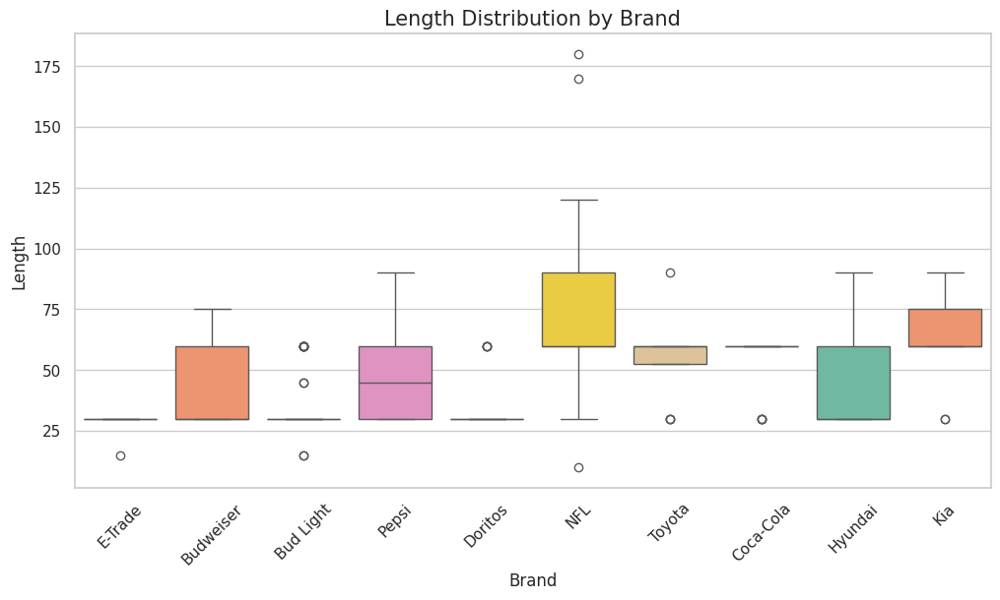

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


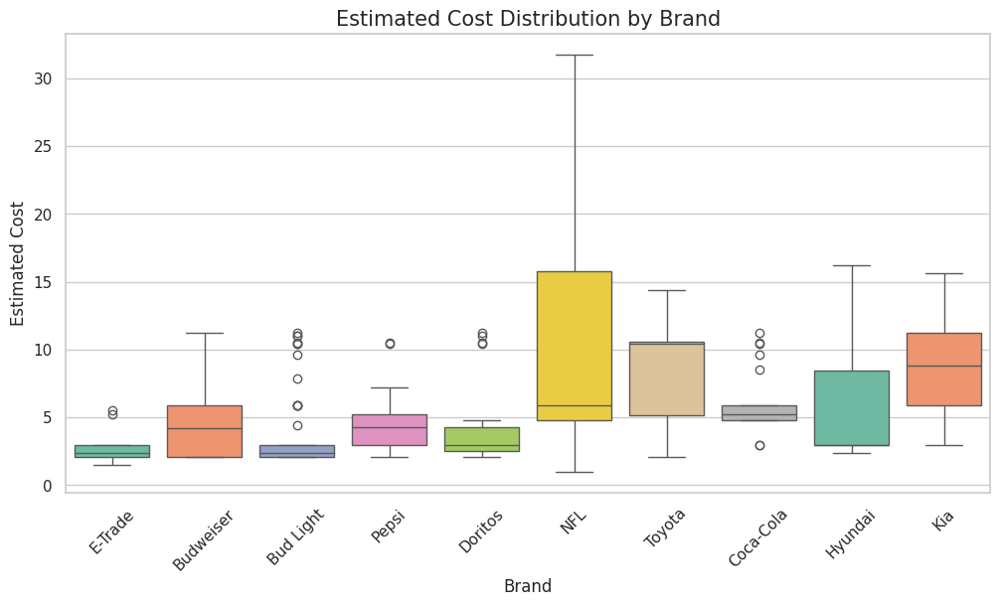

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


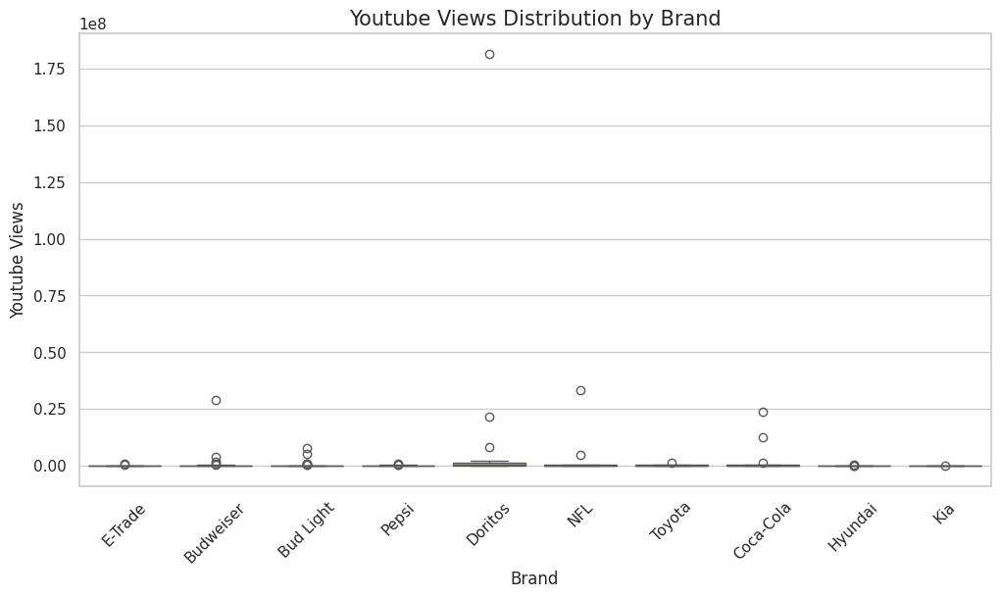

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


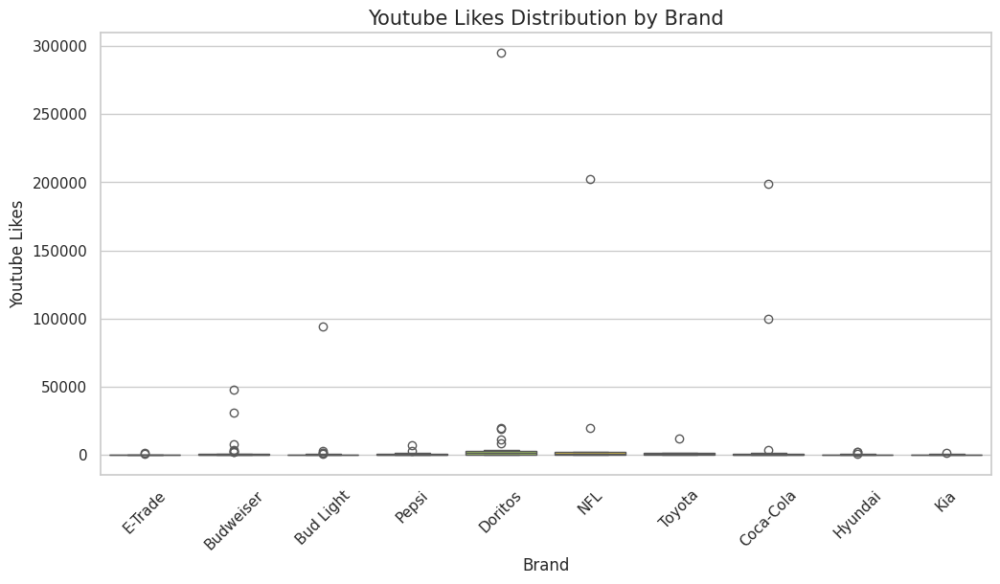

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


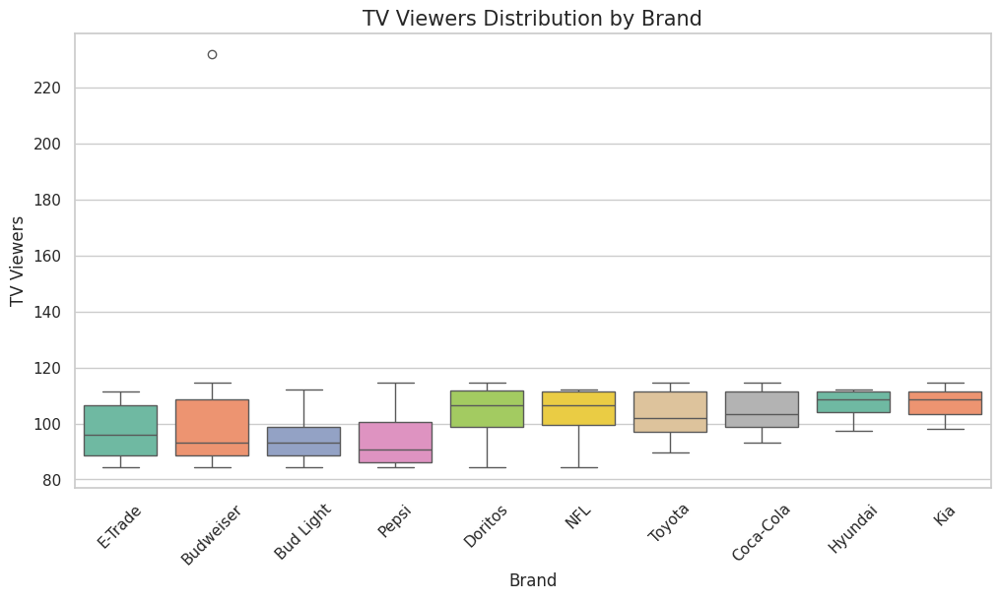

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


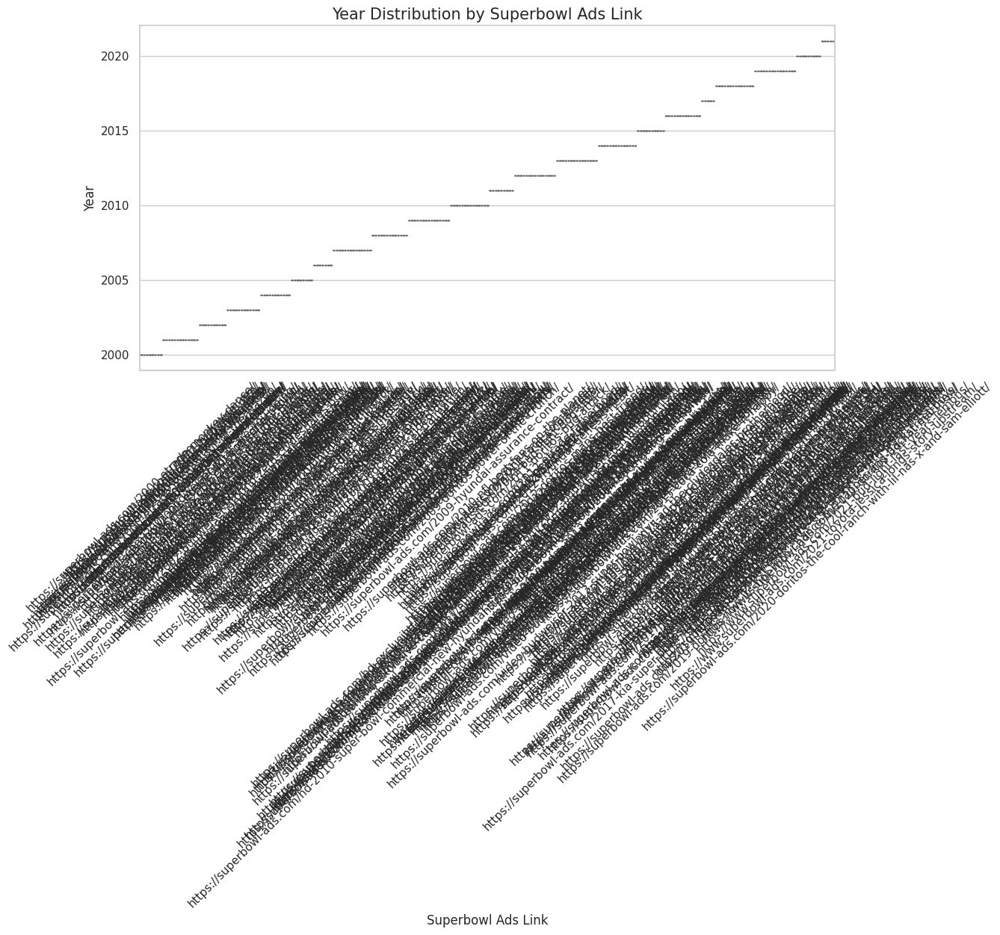

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


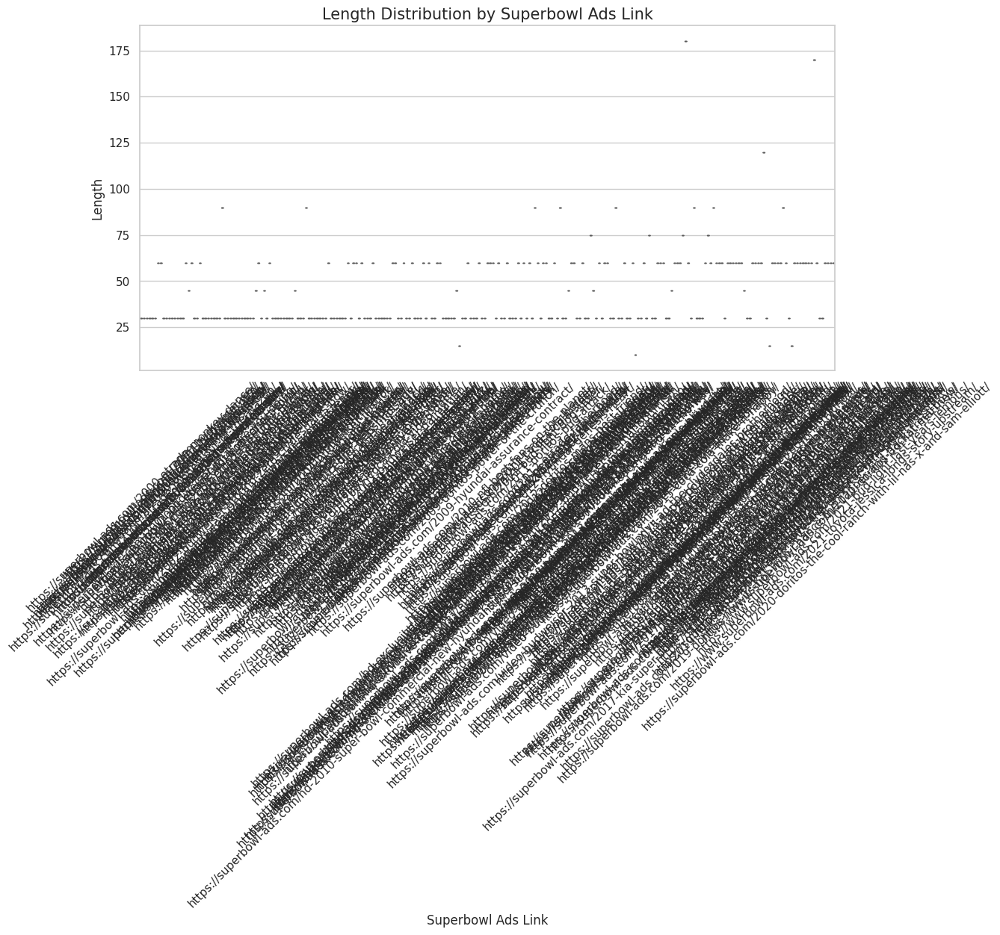

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


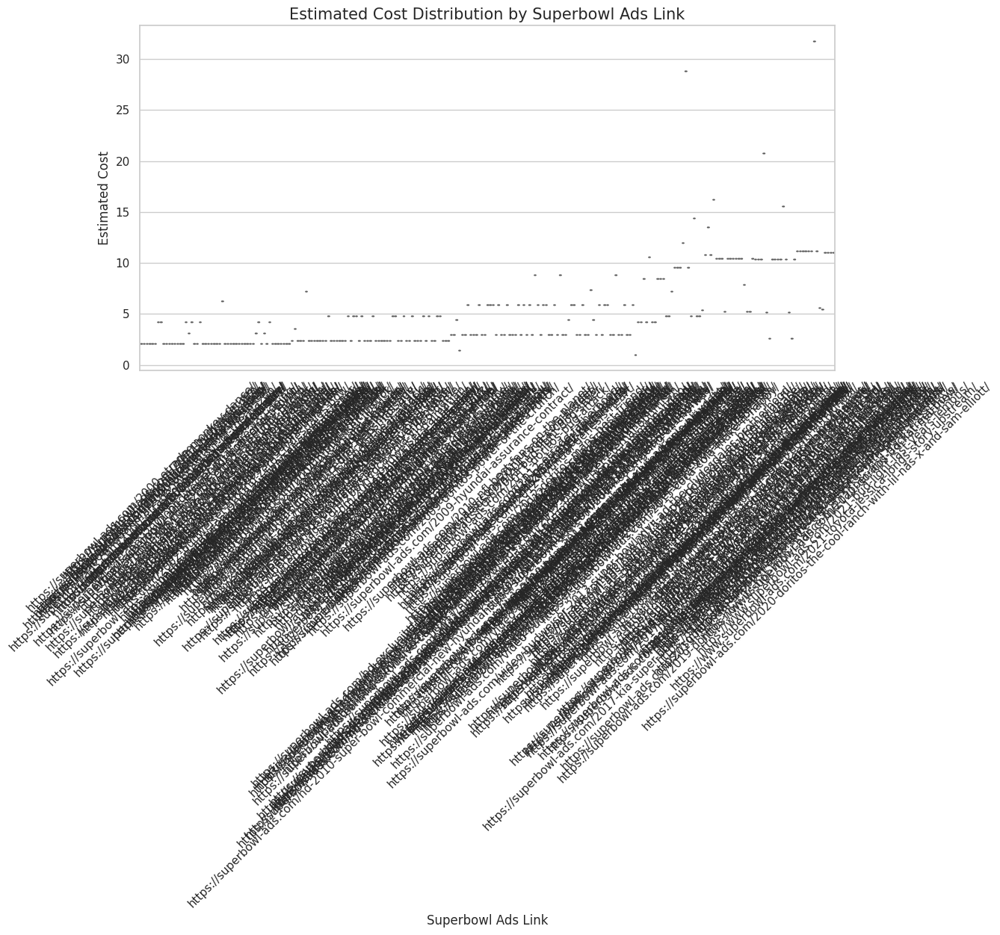

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


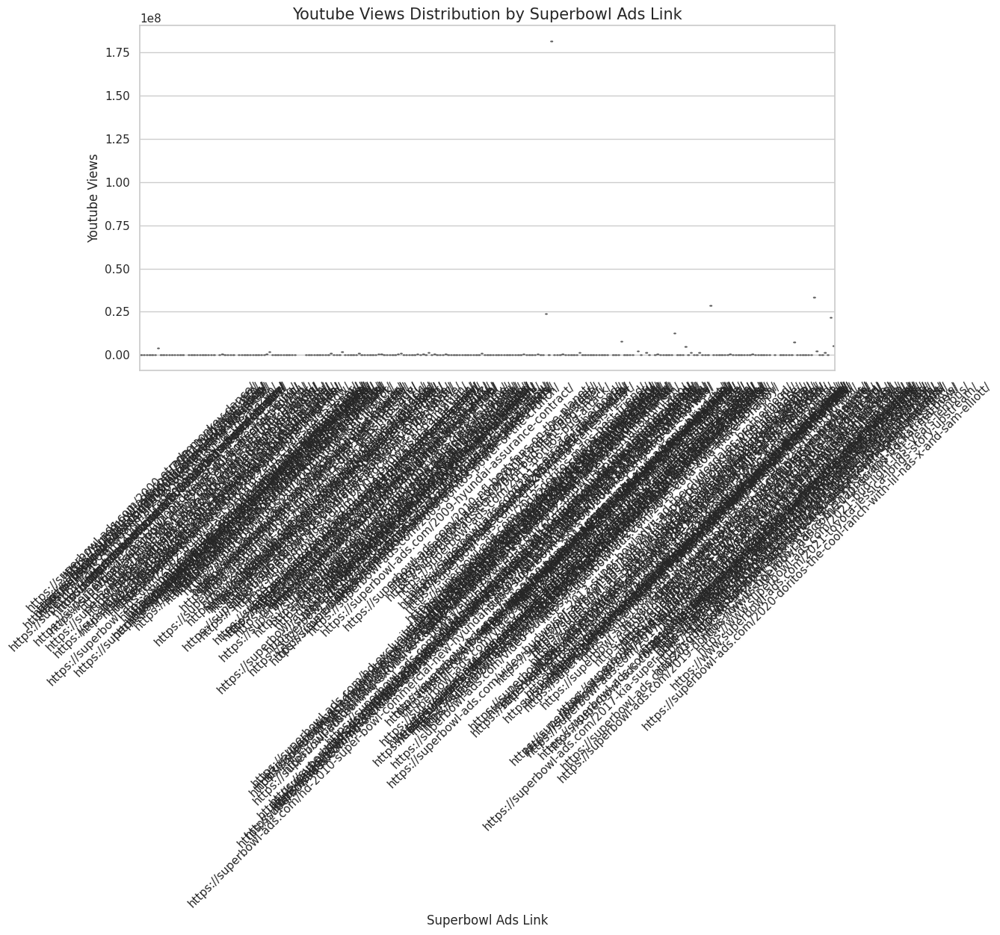

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


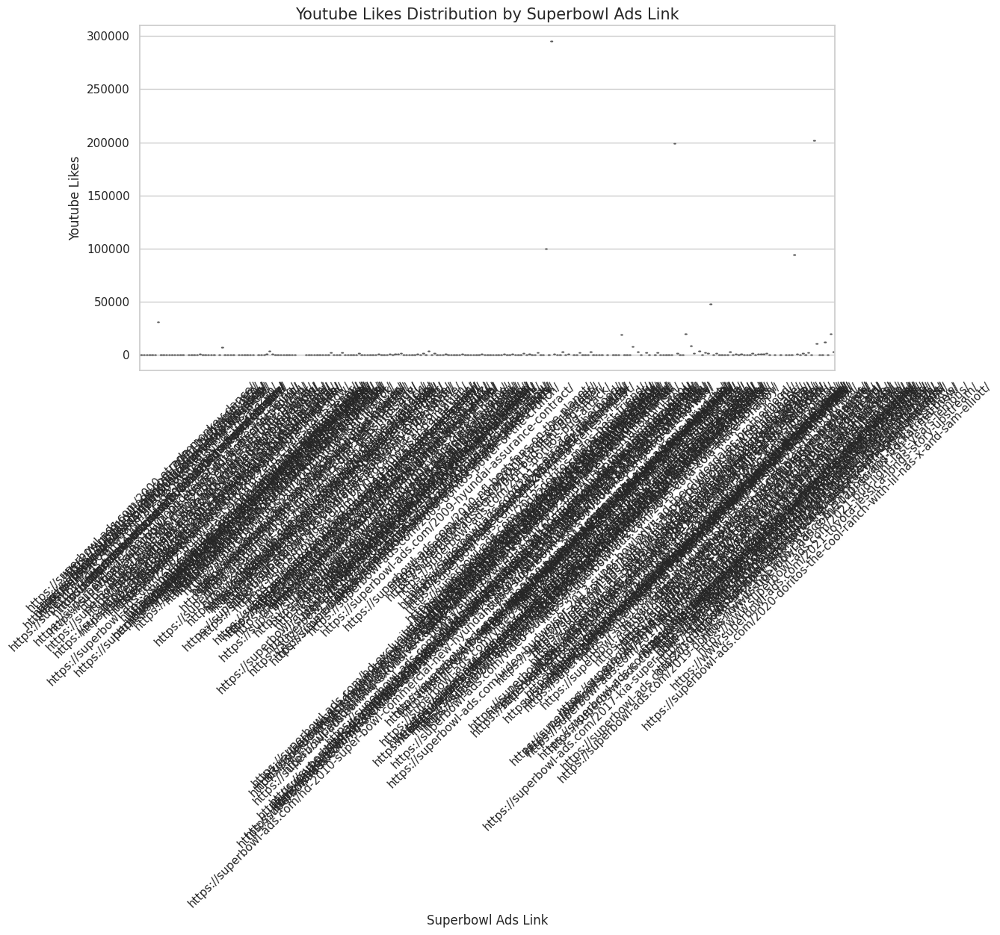

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


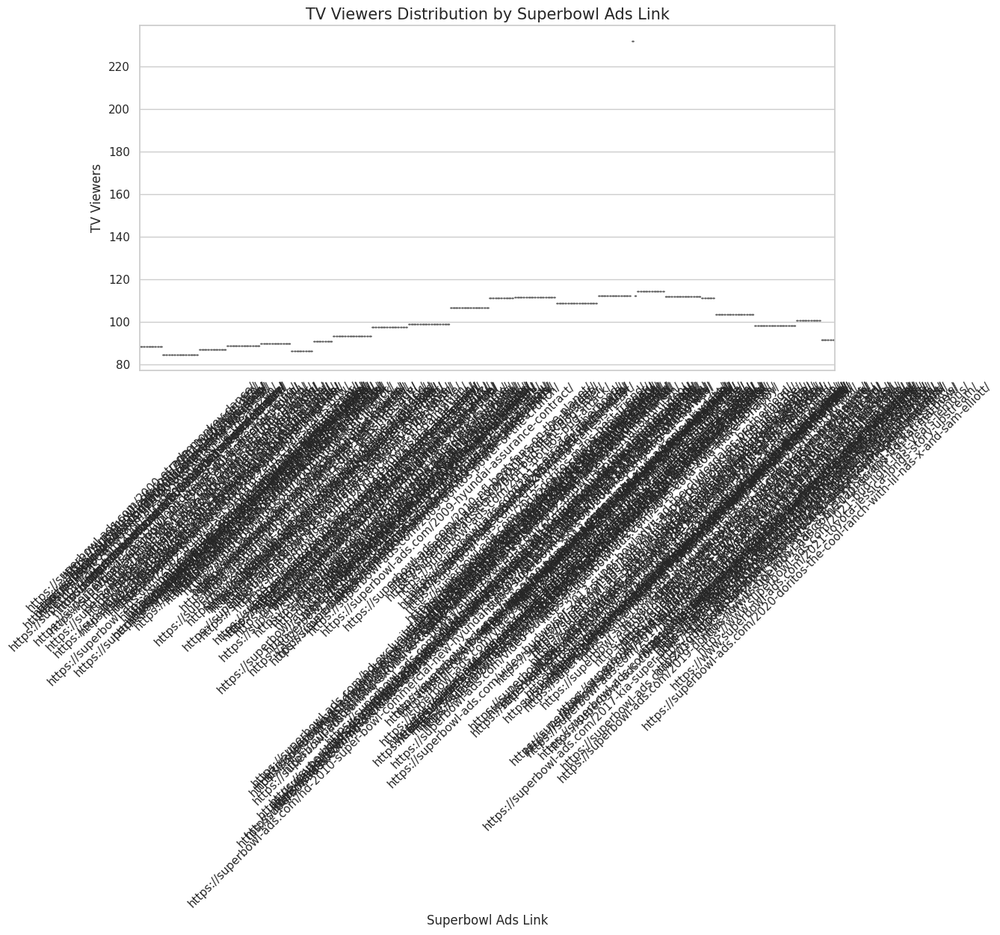

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


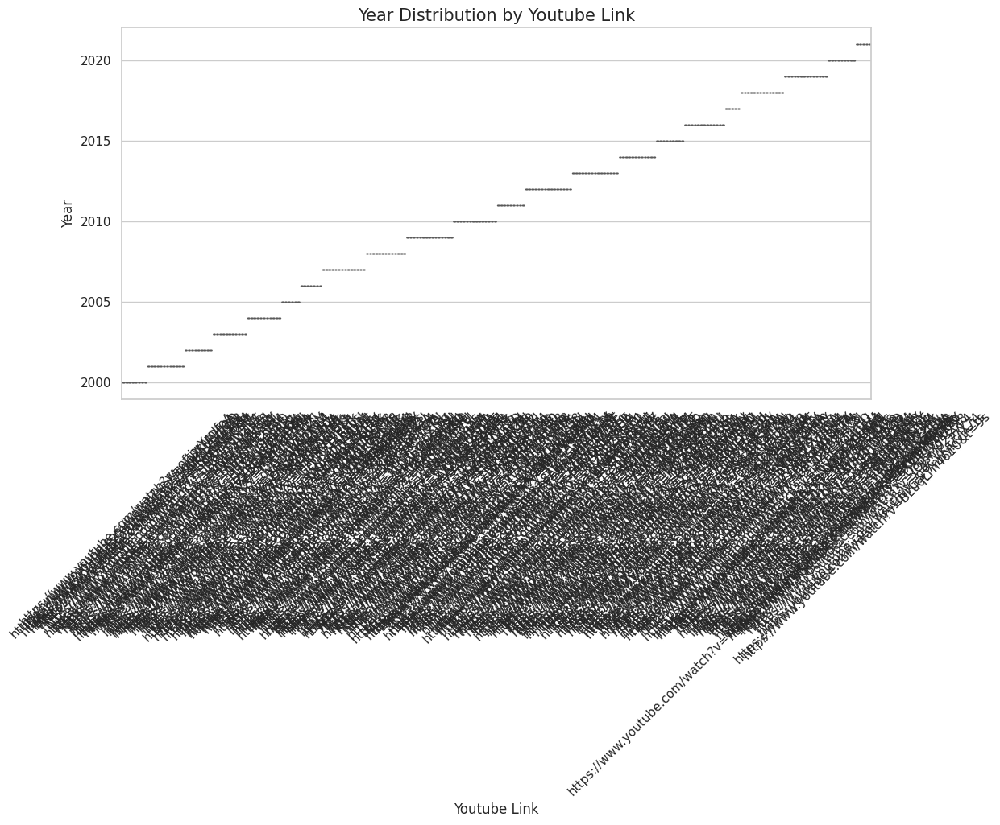

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


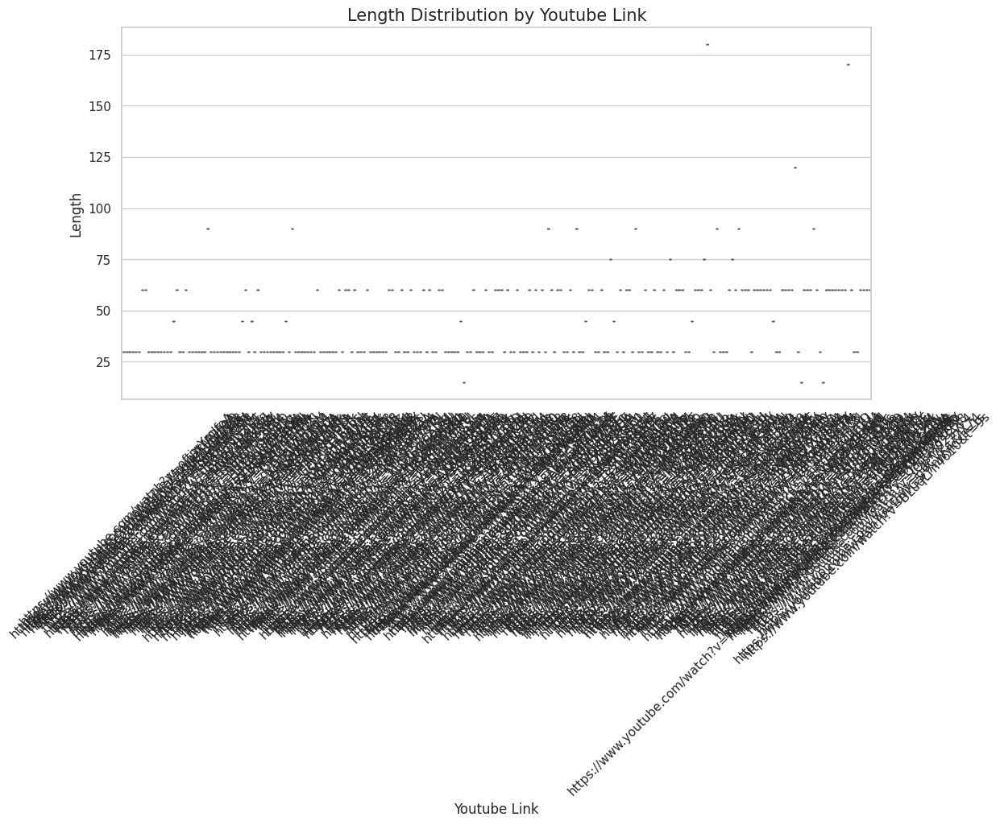

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


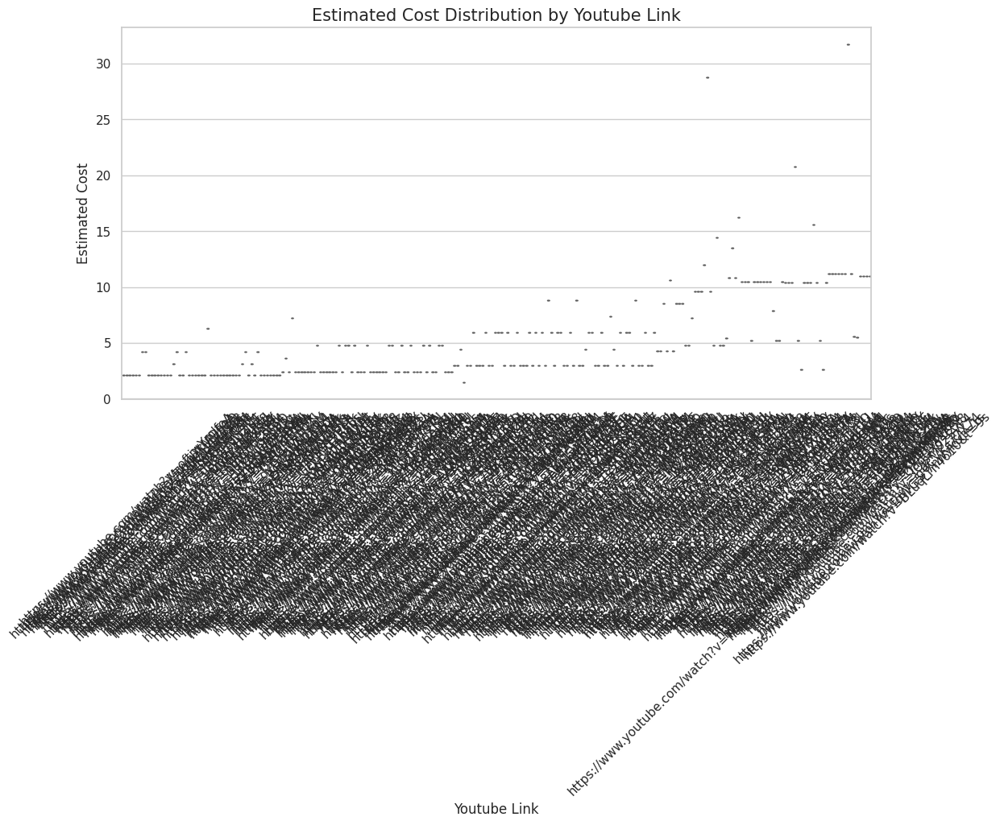

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


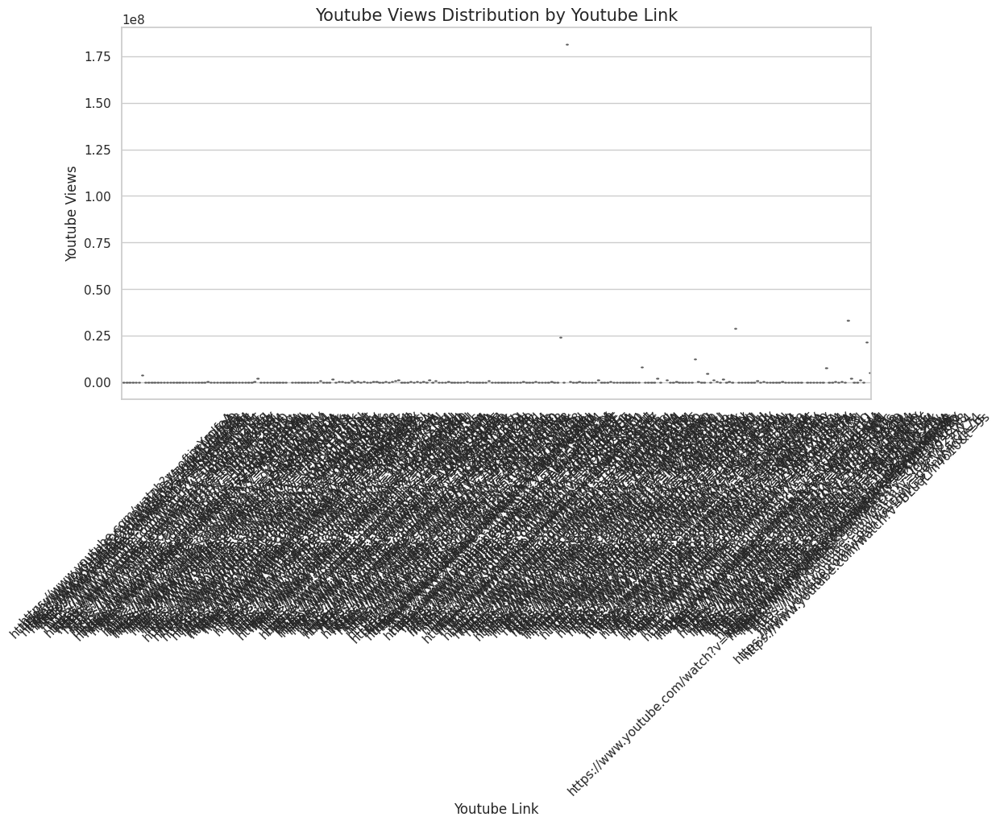

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


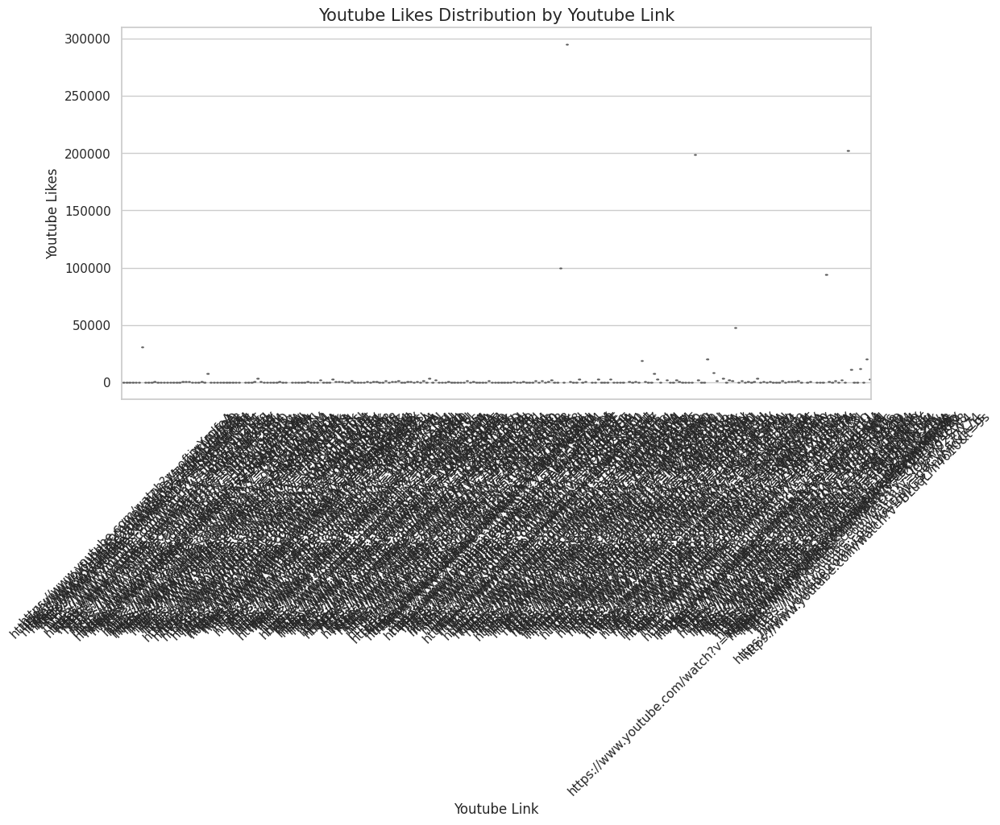

<ipython-input-10-356b72fc12e2>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)


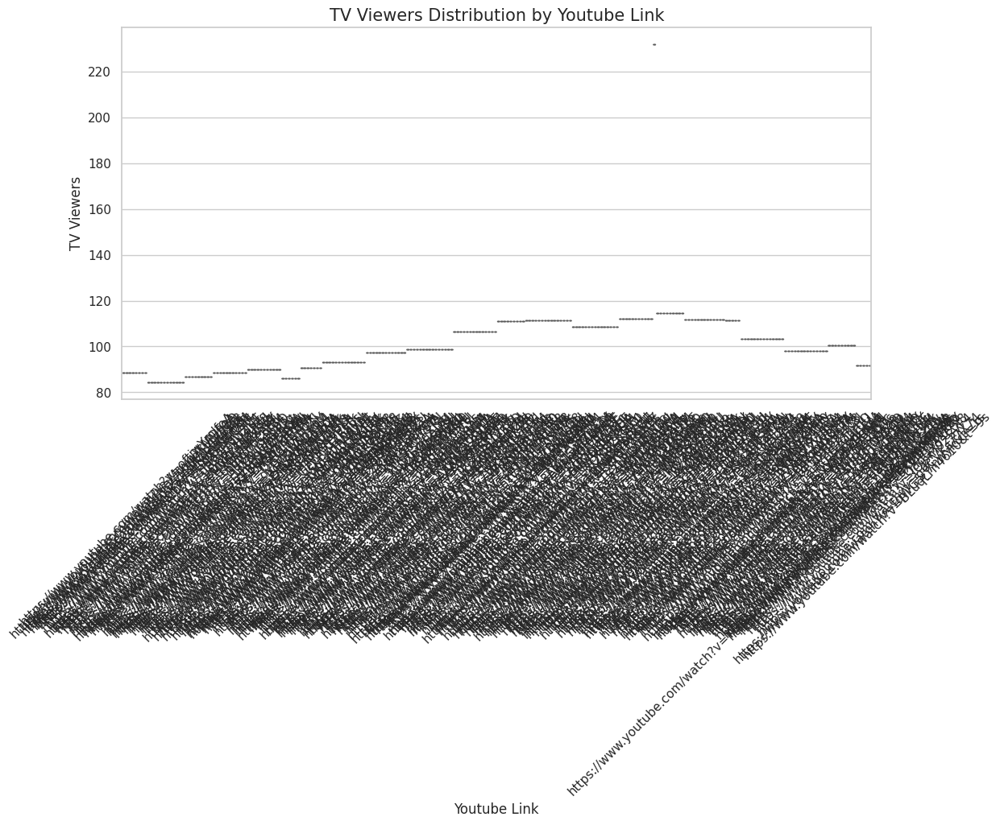

In [10]:
# Bivariate Analysis for Numerical-Numerical Relationships
# Correlation Matrix with a Colorful Heatmap
plt.figure(figsize=(10, 8))
correlation_matrix = data[numerical_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", square=True, cbar_kws={'shrink': .8})
plt.title('Correlation Heatmap of Numerical Variables', fontsize=15)
plt.show()

# Pair Plot for Numerical Variables with a Colorful Hue for Categorical Column (if available)
if len(categorical_columns) > 0:
    sns.pairplot(data, hue=categorical_columns[0], palette="Spectral", corner=True)
    plt.suptitle("Pair Plot with Hue", y=1.02, fontsize=15)
    plt.show()

# Box Plot for Numerical-Categorical Relationships with Colorful Palettes
for cat_col in categorical_columns:
    for num_col in numerical_columns:
        plt.figure(figsize=(12, 6))
        sns.boxplot(x=data[cat_col], y=data[num_col], palette="Set2", saturation=0.8)
        plt.title(f'{num_col} Distribution by {cat_col}', fontsize=15)
        plt.xlabel(cat_col, fontsize=12)
        plt.ylabel(num_col, fontsize=12)
        plt.xticks(rotation=45)
        plt.show()


MULTIVARIATE ANALYSIS

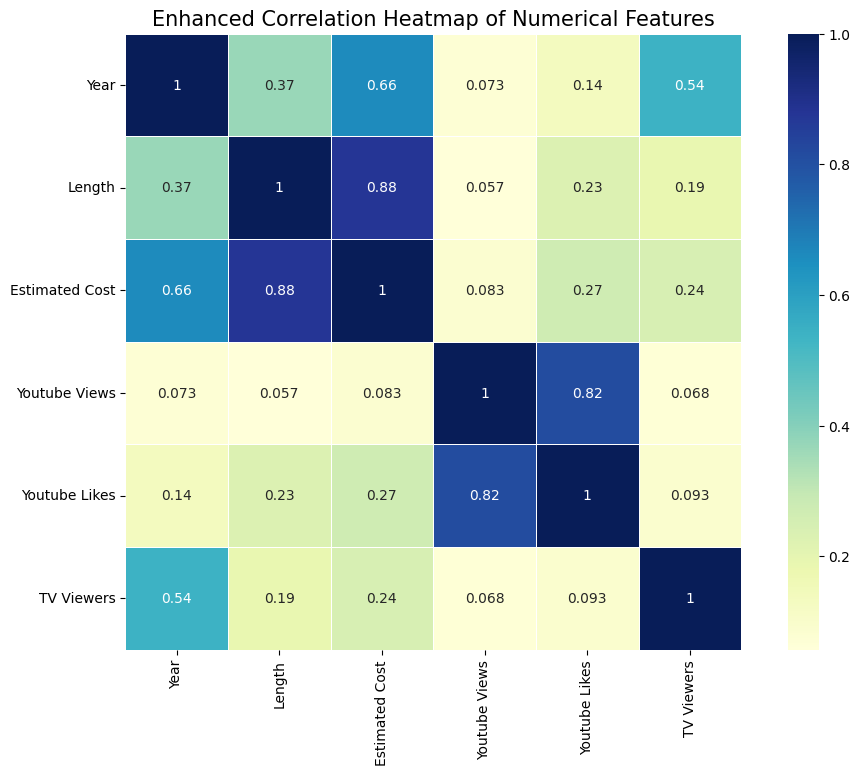

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1615: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1615: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1615: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1615: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1615: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1615:

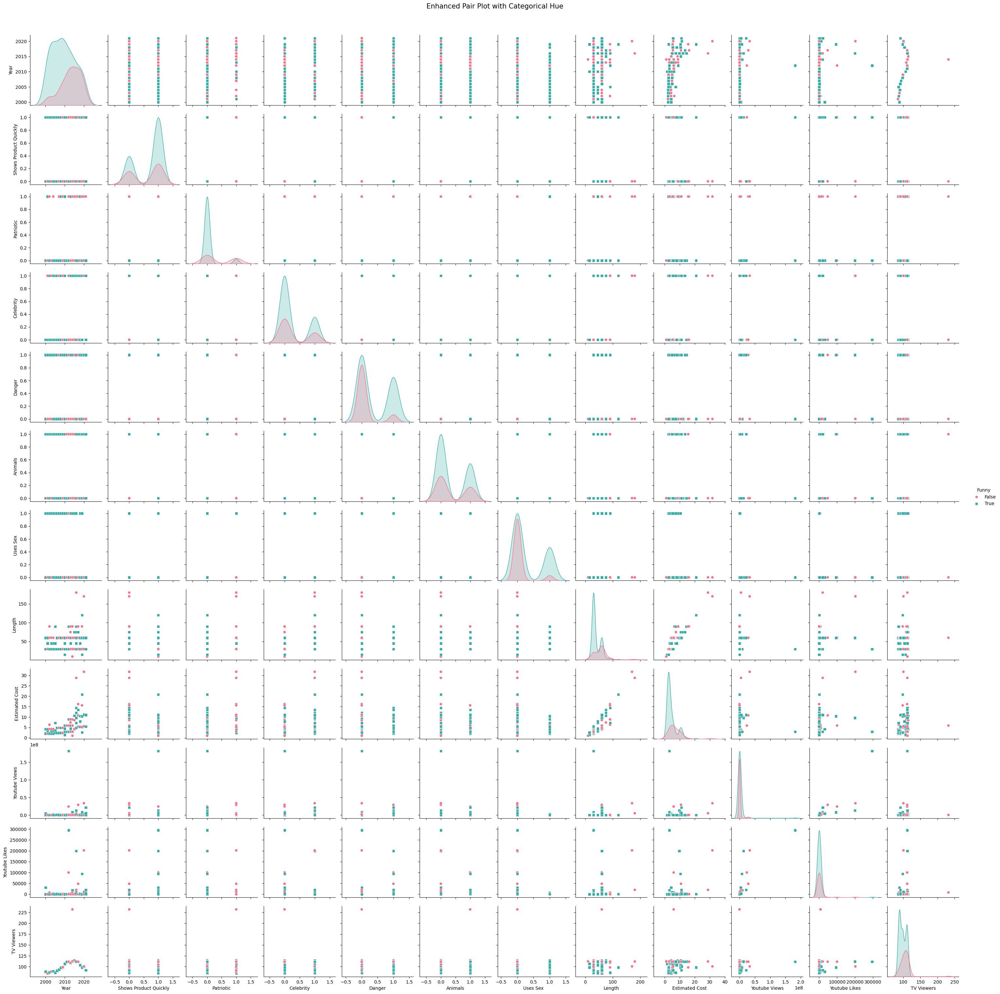

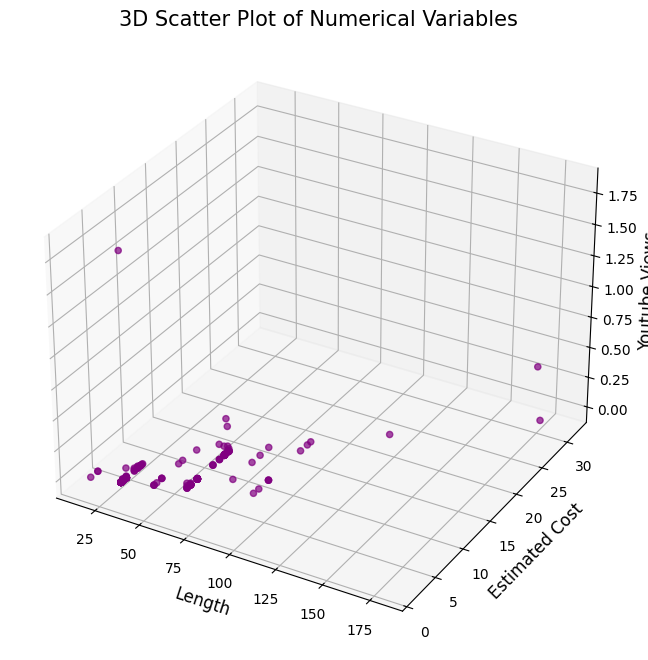

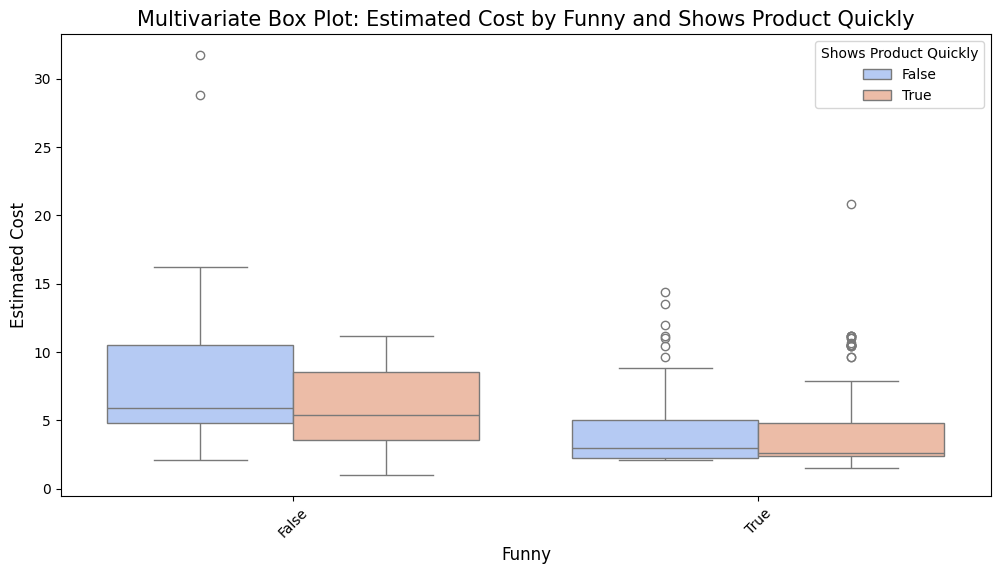

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

# Load the dataset
data = pd.read_csv('/content/sample_data/superbowl_commercials.csv')

# Define numerical and categorical columns based on the dataset inspection
numerical_columns = ['Year', 'Length', 'Estimated Cost', 'Youtube Views', 'Youtube Likes', 'TV Viewers']
categorical_columns = ['Brand', 'Funny', 'Shows Product Quickly', 'Patriotic', 'Celebrity', 'Danger', 'Animals', 'Uses Sex']

# Heatmap of Correlation Matrix for Numerical Variables
plt.figure(figsize=(12, 8))
sns.heatmap(data[numerical_columns].corr(), annot=True, cmap="YlGnBu", linewidths=.5, square=True)
plt.title('Enhanced Correlation Heatmap of Numerical Features', fontsize=15)
plt.show()

# Pair Plot with Hue and Different Style (using the first categorical variable as hue)
if len(categorical_columns) > 0:
    sns.pairplot(data, hue=categorical_columns[1], palette="husl", markers=["o", "s", "D"], diag_kind="kde")
    plt.suptitle("Enhanced Pair Plot with Categorical Hue", y=1.02, fontsize=15)
    plt.show()

# 3D Scatter Plot (if at least 3 numerical columns are available)
if len(numerical_columns) >= 3:
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    x = data[numerical_columns[1]]
    y = data[numerical_columns[2]]
    z = data[numerical_columns[3]]

    ax.scatter(x, y, z, c="purple", marker="o", alpha=0.7)
    ax.set_xlabel(numerical_columns[1], fontsize=12)
    ax.set_ylabel(numerical_columns[2], fontsize=12)
    ax.set_zlabel(numerical_columns[3], fontsize=12)
    plt.title('3D Scatter Plot of Numerical Variables', fontsize=15)
    plt.show()

# Box Plot with Multiple Categorical Variables
if len(categorical_columns) > 1:
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=data, x=categorical_columns[1], y=numerical_columns[2], hue=categorical_columns[2], palette="coolwarm", dodge=True)
    plt.title(f'Multivariate Box Plot: {numerical_columns[2]} by {categorical_columns[1]} and {categorical_columns[2]}', fontsize=15)
    plt.xlabel(categorical_columns[1], fontsize=12)
    plt.ylabel(numerical_columns[2], fontsize=12)
    plt.xticks(rotation=45)
    plt.show()
